<a href="https://colab.research.google.com/github/RamoniReus/CovidDeepLearning/blob/main/best_validation_results.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## IMPORTAÇÃO E COLETA DE IMAGENS

In [ ]:
from fastai.vision.all import *

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
path = Path('/content/drive/MyDrive/Database2/TRAIN')
!ls

drive  sample_data


# CRIAÇÃO DO DATABLOCK E APRENDIZAGEM DO MODELO

In [ ]:
files = get_image_files(path)

In [ ]:
dblock = DataBlock (blocks= (ImageBlock,CategoryBlock),
                     get_items = get_image_files,
                     get_y=parent_label,
                     item_tfms=Resize(224),
                     splitter = RandomSplitter(valid_pct=0.2,seed=42))

In [ ]:
dsets = dblock.datasets(path)

In [ ]:
dblock.summary(path)

In [ ]:
dls = dblock.dataloaders(path)

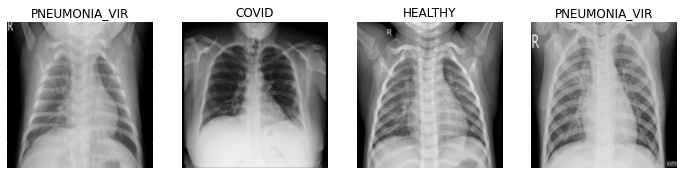

In [ ]:
dls.valid.show_batch(max_n=4, nrows=1)

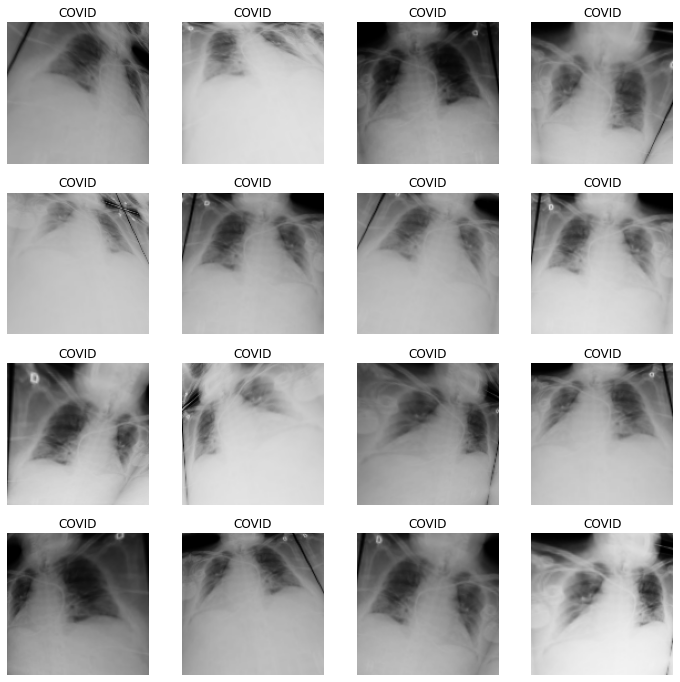

In [ ]:
raiox = dblock.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls = raiox.dataloaders(path)
dls.train.show_batch(max_n=16, nrows=4, unique=True)


In [ ]:
learn = vision_learner(dls, resnet50, metrics=[accuracy, error_rate])
learn.fine_tune(10)

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,1.367110,0.996205,0.737500,0.262500,00:12


epoch,train_loss,valid_loss,accuracy,error_rate,time
0,0.761280,0.606914,0.830000,0.170000,00:12
1,0.681551,0.423235,0.885000,0.115000,00:13
2,0.558357,0.304912,0.925000,0.075000,00:12
3,0.487851,0.285514,0.920000,0.080000,00:12
4,0.396784,0.235740,0.940000,0.060000,00:13
5,0.329845,0.226323,0.937500,0.062500,00:13
6,0.293776,0.154978,0.960000,0.040000,00:13
7,0.246982,0.154119,0.952500,0.047500,00:12
8,0.214608,0.170112,0.950000,0.050000,00:12
9,0.206898,0.166373,0.952500,0.047500,00:13



# LIMPEZA DE DADOS

In [ ]:
from fastai import *
from fastai.vision.all import *
from fastai.callback.fp16 import *
from fastai.vision.widgets import *

In [ ]:
doc(ImageClassifierCleaner)

ImageClassifierCleaner(learn, *, opts: 'tuple' = (), height: 'int' = 128, width: 'int' = 256, max_n: 'int' = 30)
A widget that provides an `ImagesCleaner` for a CNN `Learner`

To get a prettier result with hyperlinks to source code and documentation, install nbdev: pip install nbdev


In [ ]:
#hide_output
cleaner = ImageClassifierCleaner(learn)
cleaner

In [ ]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()

In [ ]:
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

# INTERPRETAÇÃO DOS RESULTADOS DE TREINO E VALIDAÇÃO





In [ ]:
from fastai import *
from fastai.torch_core import *
from fastai.learner import *

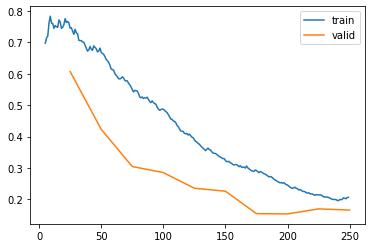

In [ ]:
learn.recorder.plot_loss (skip_start=5, with_valid=True)

In [ ]:
learn.fit_one_cycle(5, slice(3e-5,3e-4))

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,0.065266,0.642155,0.829603,0.170397,01:10
1,0.118809,0.514188,0.829603,0.170397,01:10
2,0.083233,0.579066,0.835379,0.164621,01:10
3,0.042424,0.528022,0.859928,0.140072,01:10
4,0.026510,0.554068,0.860650,0.139350,01:10


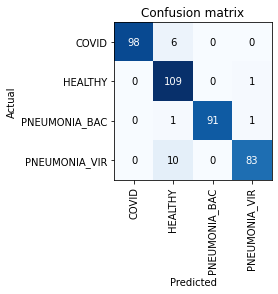

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

# TESTE

In [ ]:
path_test = Path('/content/drive/MyDrive/Database2/TEST')
!ls

drive  sample_data


In [ ]:
test_block = DataBlock (blocks= (ImageBlock,CategoryBlock),
                     get_items = get_image_files,
                     get_y=parent_label,
                     item_tfms=Resize(224),
                     splitter = RandomSplitter(valid_pct=0.2,seed=42))


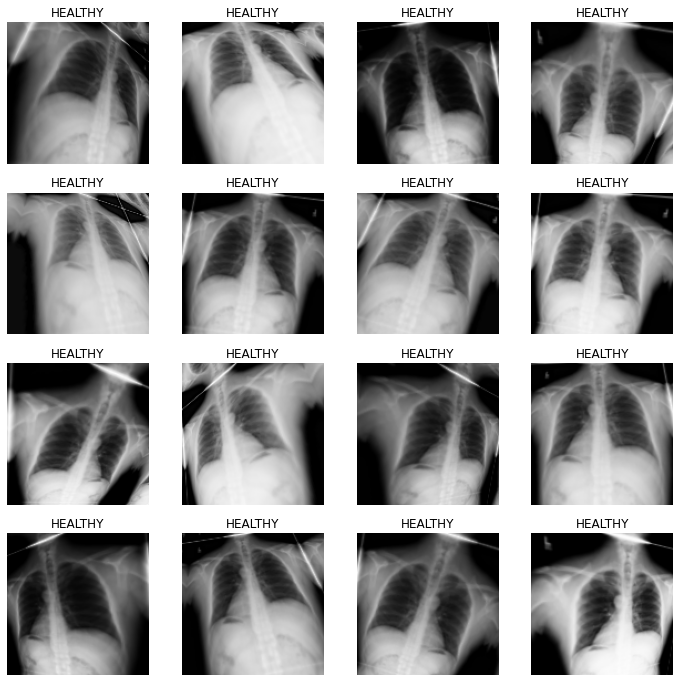

In [ ]:
raiox_test = test_block.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls_test = raiox_test.dataloaders(path_test)
dls_test.train.show_batch(max_n=16, nrows=4, unique=True)

In [ ]:
learn2 = vision_learner(dls_test, resnet50, metrics=[accuracy, error_rate])
learn2.fine_tune(10)

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


epoch,train_loss,valid_loss,accuracy,error_rate,time
0,1.314368,0.708222,0.816124,0.183876,04:45


epoch,train_loss,valid_loss,accuracy,error_rate,time
0,0.659947,0.281319,0.908062,0.091938,00:22
1,0.499189,0.260347,0.925035,0.074965,00:21
2,0.413475,0.172040,0.940594,0.059406,00:22
3,0.321997,0.148259,0.953324,0.046676,00:22
4,0.275858,0.110348,0.961810,0.038190,00:21
5,0.217795,0.088507,0.968883,0.031117,00:22
6,0.186396,0.090799,0.967468,0.032532,00:22
7,0.151491,0.073041,0.974540,0.025460,00:22
8,0.137605,0.071313,0.977369,0.022631,00:22
9,0.115106,0.071586,0.977369,0.022631,00:22


In [ ]:
for batch_idx, data in enumerate(dsets_test, 0):
    y = data 
    
    break


In [ ]:
for batch in dsets_test:
  #a = np.array(batch)
  index = output.cpu().batch.numpy().argmax()
  #true = a.numpy()
  
  print(batch)
  
  break

NameError: ignored

In [ ]:
preds = learn2.get_preds(dl = dls_test)

IndexError: ignored

In [ ]:
print(a)
print(preds)

tensor([1, 1, 0, 0, 1, 3, 0, 0, 3, 1, 0, 1, 1, 2, 3, 3, 3, 3, 0, 2, 3, 1, 3, 1,
        2, 2, 2, 3, 3, 2, 2, 1, 3, 3, 1, 0, 1, 0, 0, 3, 2, 3, 2, 0, 2, 0, 0, 1,
        2, 1, 0, 0, 0, 1, 2, 1, 1, 1, 1, 2, 2, 0, 2, 1, 1, 1, 1, 3, 1, 0, 0, 3,
        1, 2, 0, 0, 3, 0, 3, 1, 1, 3, 3, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1,
        1, 1, 3, 0, 1, 1, 3, 1, 0, 3, 3, 1, 3, 2, 1, 0, 1, 2, 1, 0, 1, 3, 2, 3,
        1, 2, 2, 0, 2, 3, 0, 1, 0, 1, 0, 2, 2, 2, 2, 0, 3, 3, 2, 1, 1, 1, 2, 2,
        0, 2, 2, 1, 3, 2, 2, 0, 2, 0, 3, 1, 3, 1, 3, 2, 1, 1, 1, 1, 3, 2, 3, 1,
        1, 1, 1, 3, 2, 1, 2, 3, 2, 0, 2, 2, 1, 0, 3, 2, 0, 1, 3, 3, 0, 0, 2, 2,
        0, 2, 3, 1, 1, 1, 2, 0, 1, 1, 1, 0, 0, 0, 1, 3, 3, 1, 3, 1, 2, 2, 0, 2,
        0, 1, 0, 0, 2, 1, 0, 1, 2, 0, 0, 1, 1, 0, 1, 0, 2, 0, 3, 1, 2, 3, 2, 2,
        0, 0, 1, 1, 2, 0, 3, 0, 0, 2, 3, 1, 1, 0, 1, 3, 3, 1, 1, 1, 2, 0, 1, 0,
        3, 3, 1, 1, 3, 1, 3, 0, 1, 0, 0, 3, 2, 1, 1, 3, 2, 1, 1, 3, 2, 1, 1, 0,
        0, 3, 3, 0, 0, 3, 2, 2, 1, 3, 3,

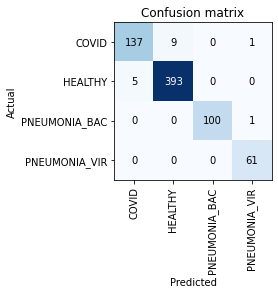

In [ ]:
results = ClassificationInterpretation.from_learner(learn2)
results.plot_confusion_matrix()


In [ ]:
a = torch.argmax(preds, dim=1)


In [ ]:
from sklearn.metrics import precision_score, \
    recall_score, confusion_matrix, classification_report, \
    accuracy_score, f1_score, roc_curve



TypeError: ignored